In [1]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt 

In [2]:
moderna_df = pd.read_csv('./query_result/cdc_moderna_vaccine_distribution_results.csv')
pfizer_df = pd.read_csv('./query_result/cdc_pfizer_vaccine_distribution_results.csv')
enigma_jhu_df = pd.read_csv('./query_result/enigma_jhu_results.csv')
nyt_county_df = pd.read_csv('./query_result/nytimes_data_in_usa_us_county_results.csv')
nyt_state_df = pd.read_csv('./query_result/nytimes_data_in_usa_us_state_results.csv')
rearc_testing_states_df = pd.read_csv('./query_result/rearc_covid19_testing_states_daily_results.csv')
rearc_testing_daily_df = pd.read_csv('./query_result/rearc_covid19_testing_us_daily_results.csv')
rearc_total_latest = pd.read_csv('./query_result/rearc_covid19_testing_us_total_latest_results.csv')
hospital_beds_df = pd.read_csv('./query_result/rearc_usa_hospital_beds_results.csv')
static_countrycod_df = pd.read_csv('./query_result/static_dataset_countrycode_results.csv')
static_countypopulation_df = pd.read_csv('./query_result/static_dataset_countypopulation_results.csv')
static_state_abv_df = pd.read_csv('./query_result/static_dataset_state_abv_results.csv')

### EDA - Exploratory Data Analysis

In [3]:
enigma_jhu_df.head()

,county,province_state,country_region,last_update,latitude,longitude,confirmed,active,combined_key,recovered,deaths,county_fips
0,San Benito,California,US,2020-02-03T03:53:02,36.576,-120.988,2,0.0,"San Benito, California, US",0,0,6069
1,King,Washington,US,2020-03-02T20:23:16,47.548,-121.984,14,0.0,"King, Washington, US",1,5,53033
2,King,Washington,US,2020-03-04T19:53:02,47.548,-121.984,31,0.0,"King, Washington, US",1,9,53033
3,Snohomish,Washington,US,2020-03-04T19:53:02,48.033,-121.834,8,0.0,"Snohomish, Washington, US",0,1,53061
4,Contra Costa,California,US,2020-03-06T19:43:02,37.853,-121.902,3,0.0,"Contra Costa, California, US",0,0,6013


In [4]:
enigma_jhu_df.shape

(194384, 12)

In [5]:
enigma_jhu_df.dtypes

county             object
province_state     object
country_region     object
last_update        object
latitude          float64
longitude         float64
confirmed           int64
active            float64
combined_key       object
recovered           int64
deaths              int64
county_fips         int64
dtype: object

In [6]:
enigma_jhu_df['last_update'] = pd.to_datetime(enigma_jhu_df['last_update'])
enigma_jhu_df.head()

,county,province_state,country_region,last_update,latitude,longitude,confirmed,active,combined_key,recovered,deaths,county_fips
0,San Benito,California,US,2020-02-03 03:53:02,36.576,-120.988,2,0.0,"San Benito, California, US",0,0,6069
1,King,Washington,US,2020-03-02 20:23:16,47.548,-121.984,14,0.0,"King, Washington, US",1,5,53033
2,King,Washington,US,2020-03-04 19:53:02,47.548,-121.984,31,0.0,"King, Washington, US",1,9,53033
3,Snohomish,Washington,US,2020-03-04 19:53:02,48.033,-121.834,8,0.0,"Snohomish, Washington, US",0,1,53061
4,Contra Costa,California,US,2020-03-06 19:43:02,37.853,-121.902,3,0.0,"Contra Costa, California, US",0,0,6013


In [7]:
enigma_jhu_df['active'] = enigma_jhu_df['active'].apply(np.int64)

In [8]:
# last update datetime
enigma_last_update_df = enigma_jhu_df[enigma_jhu_df['last_update'] == enigma_jhu_df['last_update'].max()]

In [9]:
enigma_last_update_df.head()

,county,province_state,country_region,last_update,latitude,longitude,confirmed,active,combined_key,recovered,deaths,county_fips
9577,Adams,Washington,US,2020-05-30 02:32:48,46.983,-118.560,59,59,"Adams, Washington, US",0,0,53001
9578,Allegany,Maryland,US,2020-05-30 02:32:48,39.624,-78.693,177,161,"Allegany, Maryland, US",0,16,24001
9579,Anderson,South Carolina,US,2020-05-30 02:32:48,34.518,-82.640,234,226,"Anderson, South Carolina, US",0,8,45007
9580,Arenac,Michigan,US,2020-05-30 02:32:48,44.064,-83.893,34,33,"Arenac, Michigan, US",0,1,26011
9581,Atlantic,New Jersey,US,2020-05-30 02:32:48,39.475,-74.658,2154,1996,"Atlantic, New Jersey, US",0,158,34001


In [10]:
# top 10 counties have hightest active case
top_10_confirmed_counties = enigma_last_update_df.sort_values('confirmed', ascending=False).head(10)
top_10_confirmed_counties = top_10_confirmed_counties[['county', 'province_state' ,'confirmed', 'deaths']]
top_10_confirmed_counties

,county,province_state,confirmed,deaths
174899,New York City,New York,201999,21477
38746,Cook,Illinois,76266,3570
87398,Los Angeles,California,51678,2294
155453,Nassau,New York,40226,2118
116586,Suffolk,New York,39445,1879
155500,Westchester,New York,33349,1359
174908,Philadelphia,Pennsylvania,22405,1300
145721,Middlesex,Massachusetts,20972,1583
29154,Wayne,Michigan,20227,2425
58234,Hudson,New Jersey,18919,1168


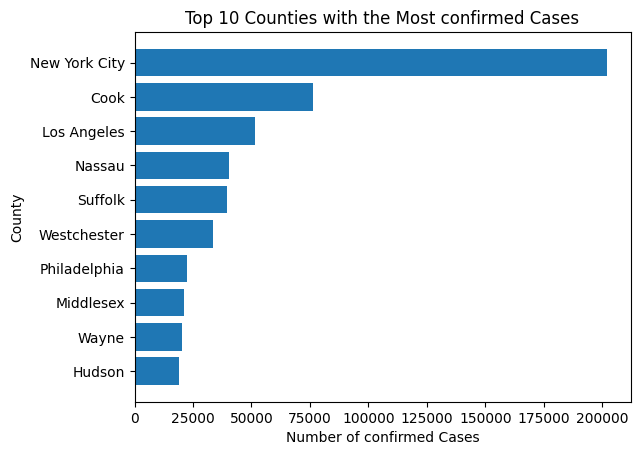

In [11]:
top_10_confirmed_counties = top_10_confirmed_counties.sort_values('confirmed', ascending=True)
plt.barh(top_10_confirmed_counties['county'], top_10_confirmed_counties['confirmed'])
plt.title('Top 10 Counties with the Most confirmed Cases')
plt.xlabel('Number of confirmed Cases')
plt.ylabel('County')
plt.show()

In [12]:
# the ratio of 'death' to 'active'
top_10_confirmed_counties['death_confirmed_ratio'] = top_10_confirmed_counties['deaths']/top_10_confirmed_counties['confirmed']
top_10_confirmed_counties

,county,province_state,confirmed,deaths,death_confirmed_ratio
58234,Hudson,New Jersey,18919,1168,0.061737
29154,Wayne,Michigan,20227,2425,0.119889
145721,Middlesex,Massachusetts,20972,1583,0.075482
174908,Philadelphia,Pennsylvania,22405,1300,0.058023
155500,Westchester,New York,33349,1359,0.040751
116586,Suffolk,New York,39445,1879,0.047636
155453,Nassau,New York,40226,2118,0.052653
87398,Los Angeles,California,51678,2294,0.044390
38746,Cook,Illinois,76266,3570,0.046810
174899,New York City,New York,201999,21477,0.106322


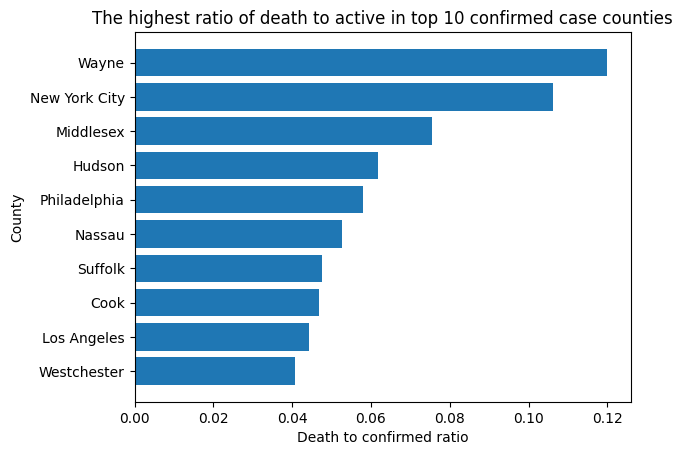

In [13]:
top_10_confirmed_counties = top_10_confirmed_counties.sort_values('death_confirmed_ratio', ascending=True)
plt.barh(top_10_confirmed_counties['county'], top_10_confirmed_counties['death_confirmed_ratio'])
plt.title('The highest ratio of death to active in top 10 confirmed case counties')
plt.xlabel('Death to confirmed ratio')
plt.ylabel('County')
plt.show()

=> New York City có số ca nhiễm nhiều nhất, và tỉ lệ tỉ vong thuộc top đầu trong 10 hạt có số ca nhiễm nhiều nhất nước Mỹ với ~ 12% tỉ lệ tử vong.

In [14]:
# Number of population of New York City
nyc_borough = ['Kings', 'Queens', 'New York', 'Bronx', 'Richmond']
nyc_population = static_countypopulation_df.loc[static_countypopulation_df['county'].isin(nyc_borough)]['population estimate 2018'].sum()
print(f'The New York City population is estimated in 2018 was {nyc_population} people')


The New York City population is estimated in 2018 was 8805593 people


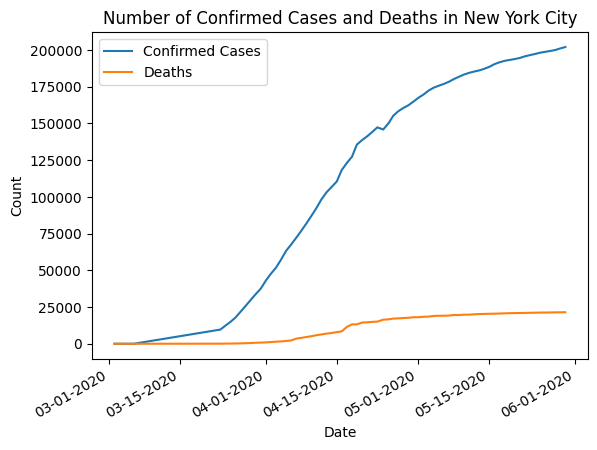

In [15]:
import matplotlib.dates as mdates

nyc_comfirmed_case = enigma_jhu_df.loc[enigma_jhu_df['county'] == 'New York City'].sort_values('last_update', ascending=False)

fig, ax = plt.subplots()
ax.plot(nyc_comfirmed_case['last_update'], nyc_comfirmed_case['confirmed'], label='Confirmed Cases')
ax.plot(nyc_comfirmed_case['last_update'], nyc_comfirmed_case['deaths'], label='Deaths')
ax.set_title('Number of Confirmed Cases and Deaths in New York City')
ax.set_xlabel('Date')
ax.set_ylabel('Count')
date_format = mdates.DateFormatter('%m-%d-%Y')
ax.xaxis.set_major_formatter(date_format)
fig.autofmt_xdate()
ax.legend()
plt.show()

In [16]:
# check the number of the hospital of New York City
nyc_hospital = hospital_beds_df.loc[hospital_beds_df['county_name'].isin(nyc_borough)]
nyc_hospital['hospital_type'].value_counts()

hospital_type
Short Term Acute Care Hospital                   51
Psychiatric Hospital                             11
VA Hospital                                       5
Long Term Acute Care Hospital                     4
Rehabilitation Hospital                           2
Childrens Hospital                                2
Religious Non-Medical Health Care Institution     1
Department of Defense Hospital                    1
Name: count, dtype: int64

In [17]:
hospital_beds_df.head()

,objectid,hospital_name,hospital_type,hq_address,hq_city,hq_state,county_name,state_name,state_fips,cnty_fips,...,num_icu_beds,adult_icu_beds,pedi_icu_beds,bed_utilization,avg_ventilator_usage,potential_increase_in_bed_capac,latitude,longtitude,county_fips,hq_zip_code
0,1,Phoenix VA Health Care System (AKA Carl T Hayd...,VA Hospital,650 E Indian School Rd,Phoenix,AZ,Maricopa,Arizona,4,13,...,0,0,0.0,0.0,0.0,0,33.495498,-112.066157,4013,85012
1,2,Southern Arizona VA Health Care System,VA Hospital,3601 S 6th Ave,Tucson,AZ,Pima,Arizona,4,19,...,2,2,0.0,0.0,2.0,0,32.181263,-110.965885,4019,85723
2,3,VA Central California Health Care System,VA Hospital,2615 E Clinton Ave,Fresno,CA,Fresno,California,6,19,...,2,2,0.0,0.0,2.0,0,36.773324,-119.779742,6019,93703
3,4,VA Connecticut Healthcare System - West Haven ...,VA Hospital,950 Campbell Ave,West Haven,CT,New Haven,Connecticut,9,9,...,1,1,0.0,0.0,2.0,0,41.284400,-72.957610,9009,6516
4,5,Wilmington VA Medical Center,VA Hospital,1601 Kirkwood Hwy,Wilmington,DE,New Castle,Delaware,10,3,...,0,0,0.0,0.0,1.0,0,39.740206,-75.606532,10003,19805


In [18]:
# bed utilization rate for each county in the New York city's borough
hospital_beds_nyc_df = hospital_beds_df.loc[(hospital_beds_df['state_name'] == 'New York') & (hospital_beds_df['county_name'].isin(nyc_borough))]
nyc_bed_util_rate = hospital_beds_nyc_df[['hospital_name', 'hospital_type', 'county_name', 'bed_utilization', 'avg_ventilator_usage']].sort_values('bed_utilization', ascending=False).head(20)
nyc_bed_util_rate


,hospital_name,hospital_type,county_name,bed_utilization,avg_ventilator_usage
5459,The Specialty Hospital at Terence Cardinal Coo...,Short Term Acute Care Hospital,New York,0.990050,0.0
4720,Bronx Psychiatric Center,Psychiatric Hospital,Bronx,0.982853,0.0
2646,Memorial Sloan Kettering Cancer Center,Short Term Acute Care Hospital,New York,0.955191,8.0
4438,Kingsboro Psychiatric Center,Psychiatric Hospital,Kings,0.954105,0.0
4943,ArchCare at Calvary Hospital - Bronx Campus,Long Term Acute Care Hospital,Bronx,0.945205,2.0
4340,Kirby Forensic Psychiatric Center,Psychiatric Hospital,New York,0.919995,0.0
2682,Staten Island University Hospital - North Campus,Short Term Acute Care Hospital,Richmond,0.919771,32.0
5586,Montefiore Hospital - Moses Campus,Short Term Acute Care Hospital,Bronx,0.908695,43.0
4455,Creedmoor Psychiatric Center,Psychiatric Hospital,Queens,0.889959,0.0
2677,NewYork-Presbyterian Queens,Short Term Acute Care Hospital,Queens,0.886739,23.0


=> Từ các phân tích trên, có thể đưa ra một số nguyên do khiến cho số ca nhiễm và tỉ lệ tử vong ở thành phố New York  cao:
1. Mật độ dân số: Thành phố New York là một trong những thành phố đông dân nhất thế giới, với dân số gần 9 triệu người (2018) trong một khu vực địa lý tương đối nhỏ. Điều này có thể khiến bệnh truyền nhiễm như Covid lây lan nhanh chóng.
2. Mức độ tương tác xã hội cao: Thành phố New York được biết đến với cuộc sống về đêm nhộn nhịp, hệ thống giao thông công cộng đông đúc và nhiều sự kiện văn hoá và điểm tham quan. Điều này có thể gây khó khăn trong việc giãn cách xã hội và các biện pháp khác để ngăn chặn sự lây lan của Covid.
3. Số lượng bệnh viện hạn chế: Trong khi thành phố New York được biết đến là thành phố có hệ thống chăm sóc sức khoẻ mạnh mẽ, vẫn có nhiều thách thức liên quan đến dịch vụ chăm sóc sức khoẻ cho một số lượng dân cư lớn. Điển hình là NYC đã phải lập thêm bệnh viện tạm thời (< 25 ngày) để phục vụ cho việc phòng chống Covid.
Những điều trên có thể góp phần làm cho thành phố New York có số lượng ca nhiễm và tỉ lệ tử vong cao.
Thêm nữa, nhìn qua 20 bệnh viện thuộc thành phố New York có tỉ lệ sử dụng giường bệnh cao, cho thấy tình hình dịch bệnh vào tháng 5/2020 ở thành phố New York diễn biến căng thẳng khi mà các bệnh viện hoạt động gần hết giường bệnh, và có nhiều nơi có thời gian sử dụng máy thở cao.

In [19]:
enigma_us_data = enigma_jhu_df[['country_region','last_update','confirmed', 'deaths']]
enigma_us_data['date'] = pd.to_datetime(enigma_us_data['last_update']).dt.date
enigma_us_data = enigma_us_data.groupby('date')[['confirmed', 'deaths']].sum().reset_index()
enigma_us_data.head()


C:\Users\guett\AppData\Local\Temp\ipykernel_7164\2785352624.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  enigma_us_data['date'] = pd.to_datetime(enigma_us_data['last_update']).dt.date


,date,confirmed,deaths
0,2020-02-01,6,0
1,2020-02-03,4,0
2,2020-02-11,1,0
3,2020-02-13,2,0
4,2020-02-21,6,0


##### NYTimes Data - Couty Results

In [3]:
nyt_county_df.head()

,date,county,state,fips,cases,deaths
0,2021-12-30,Catahoula,Louisiana,22025.0,1879,48.0
1,2021-12-30,Claiborne,Louisiana,22027.0,2138,66.0
2,2021-12-30,Concordia,Louisiana,22029.0,3402,80.0
3,2021-12-30,De Soto,Louisiana,22031.0,5107,115.0
4,2021-12-30,East Baton Rouge,Louisiana,22033.0,70112,1180.0


In [4]:
nyt_county_df[['deaths', 'fips']] = nyt_county_df[['deaths', 'fips']].apply(np.int64) 
nyt_county_df.head()

,date,county,state,fips,cases,deaths
0,2021-12-30,Catahoula,Louisiana,22025,1879,48
1,2021-12-30,Claiborne,Louisiana,22027,2138,66
2,2021-12-30,Concordia,Louisiana,22029,3402,80
3,2021-12-30,De Soto,Louisiana,22031,5107,115
4,2021-12-30,East Baton Rouge,Louisiana,22033,70112,1180


In [5]:
nyt_us_data_df = nyt_county_df.groupby('date')[['cases', 'deaths']].sum().reset_index()
nyt_us_data_df['date'] = pd.to_datetime(nyt_us_data_df['date']).dt.date
nyt_us_data_df.head()

,date,cases,deaths
0,2020-01-21,1,0
1,2020-01-22,1,0
2,2020-01-23,1,0
3,2020-01-24,2,0
4,2020-01-25,3,0


In [23]:
# Get the total cases and deaths
total_cases = nyt_us_data_df[nyt_us_data_df['date'] == nyt_us_data_df['date'].max()].groupby('date')['cases'].sum().reset_index()[['cases']]
total_deaths = nyt_us_data_df[nyt_us_data_df['date'] == nyt_us_data_df['date'].max()].groupby('date')['deaths'].sum().reset_index()[['deaths']]

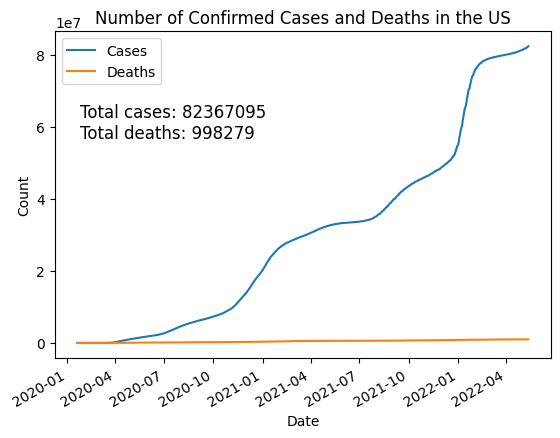

In [24]:
# the death and case of US from 24/3/2020 -> 6/1/2022
fig, ax = plt.subplots()
ax.plot(nyt_us_data_df['date'], nyt_us_data_df['cases'], label='Cases')
ax.plot(nyt_us_data_df['date'], nyt_us_data_df['deaths'], label='Deaths')
ax.set_title('Number of Confirmed Cases and Deaths in the US')
ax.set_xlabel('Date')
ax.set_ylabel('Count')

# Add the text annotation to the top of the plot
ax.annotate(f'Total cases: {total_cases.values[0][0]}\nTotal deaths: {total_deaths.values[0][0]}',
            xy=(0.05, 0.78),
            xycoords='axes fraction',
            ha='left',
            va='top',
            fontsize=12)

# ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
# ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
fig.autofmt_xdate()
ax.legend()

plt.show()

In [6]:
nyt_data_each_day_df = nyt_county_df.groupby('date')[['cases', 'deaths']].sum().reset_index()
nyt_data_each_day_df['date'] = pd.to_datetime(nyt_data_each_day_df['date']).dt.date
nyt_data_each_day_df.head()

,date,cases,deaths
0,2020-01-21,1,0
1,2020-01-22,1,0
2,2020-01-23,1,0
3,2020-01-24,2,0
4,2020-01-25,3,0


In [13]:
nyt_data_each_day_df[['cases', 'deaths']] = nyt_data_each_day_df[['cases', 'deaths']].diff()
nyt_data_each_day_df['cases'].iloc[0] = 1
nyt_data_each_day_df['deaths'].iloc[0] = 0
nyt_data_each_day_df

C:\Users\guett\AppData\Local\Temp\ipykernel_17944\1016121894.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nyt_data_each_day_df['cases'].iloc[0] = 1
C:\Users\guett\AppData\Local\Temp\ipykernel_17944\1016121894.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nyt_data_each_day_df['deaths'].iloc[0] = 0


,date,cases,deaths
0,2020-01-21,1.0,0.0
1,2020-01-22,0.0,0.0
2,2020-01-23,0.0,0.0
3,2020-01-24,1.0,0.0
4,2020-01-25,1.0,0.0
...,...,...,...
839,2022-05-09,112718.0,329.0
840,2022-05-10,93413.0,304.0
841,2022-05-11,161535.0,565.0
842,2022-05-12,115357.0,372.0


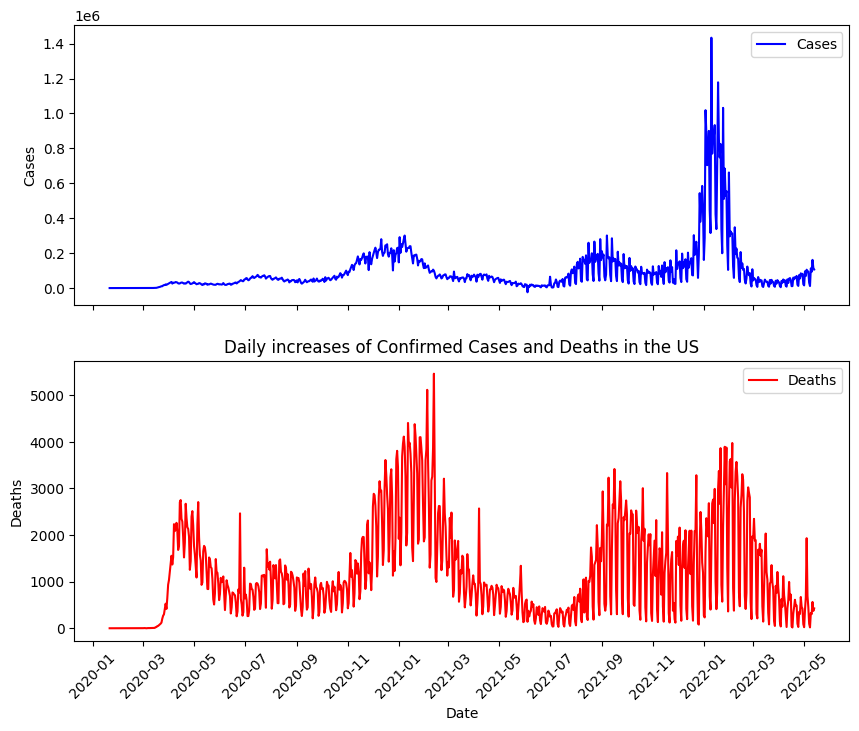

In [17]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# plot cases on ax1
ax1.plot(nyt_data_each_day_df['date'], nyt_data_each_day_df['cases'], label='Cases', color='blue')
ax1.set_ylabel('Cases')
ax1.legend()

# plot deaths on ax2
ax2.plot(nyt_data_each_day_df['date'], nyt_data_each_day_df['deaths'], label='Deaths', color='red')
ax2.set_ylabel('Deaths')
ax2.legend()

# set title and x-label on bottom plot
ax2.set_title('Daily increases of Confirmed Cases and Deaths in the US')
ax2.set_xlabel('Date')

# set x-axis ticks and format
ax2.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

# rotate x-axis tick labels
plt.xticks(rotation=45)

plt.show()

=> Khoảng thời gian từ 11/2021 -> 3/2022, số ca nhiễm của Mỹ tăng đột biến, có thể nguyên do nằm ở biến thể mới phát hiện ở thời gian đó - biến thể Omicron (B.1.1.529)
Ngoài ra những đợt sóng tăng ở cả ca nhiễm và ca tử vong đều nằm ở khoảng thời gian mà biến thể mới xuất hiện.

In [7]:
nyt_total_df = nyt_county_df.groupby('date')[['cases', 'deaths']].sum().reset_index()
nyt_total_df.head()


,date,cases,deaths
0,2020-01-21,1,0
1,2020-01-22,1,0
2,2020-01-23,1,0
3,2020-01-24,2,0
4,2020-01-25,3,0


In [9]:
# calculate the 7-day moving average of cases and deaths
nyt_total_df['cases_ma7'] = nyt_total_df['cases'].rolling(window=7).mean().reset_index(0, drop=True)
nyt_total_df['deaths_ma7'] = nyt_total_df['deaths'].rolling(window=7).mean().reset_index(0, drop=True)

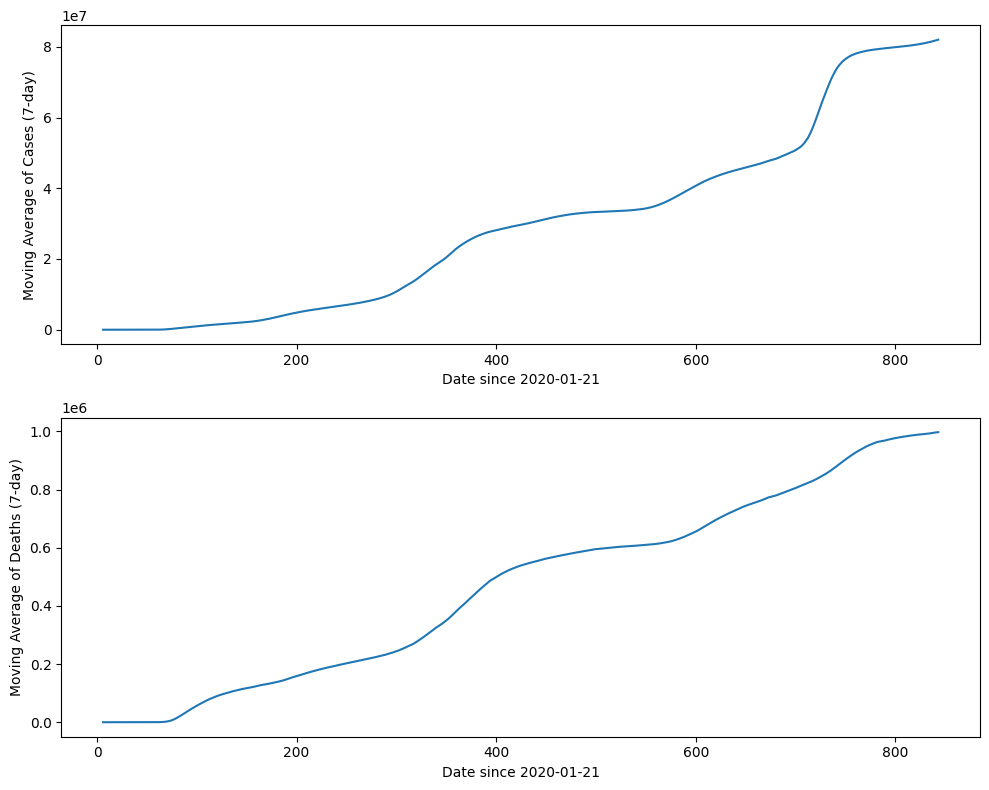

In [15]:

# Create separate plots for cases and deaths
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10,8))

# Plot moving average of cases
nyt_total_df['cases_ma7'].plot(ax=ax1)
ax1.set_xlabel('Date since 2020-01-21')
ax1.set_ylabel('Moving Average of Cases (7-day)')

# Plot moving average of deaths
nyt_total_df['deaths_ma7'].plot(ax=ax2)
ax2.set_xlabel('Date since 2020-01-21')
ax2.set_ylabel('Moving Average of Deaths (7-day)')

plt.tight_layout()
plt.show()

In [28]:
nyt_state_df.head()

,date,state,fips,cases,deaths
0,2020-01-21,Washington,53,1,0
1,2020-01-22,Washington,53,1,0
2,2020-01-23,Washington,53,1,0
3,2020-01-24,Illinois,17,1,0
4,2020-01-24,Washington,53,1,0


In [29]:
nyt_states_data_df = nyt_state_df[nyt_state_df['date'] == nyt_state_df['date'].max()][['state', 'cases', 'deaths']]
nyt_states_data_df.head(5)

,state,cases,deaths
46094,Alabama,1329827,19695
46095,Alaska,263986,1246
46096,American Samoa,6069,31
46097,Arizona,2077346,30372
46098,Arkansas,851275,11527


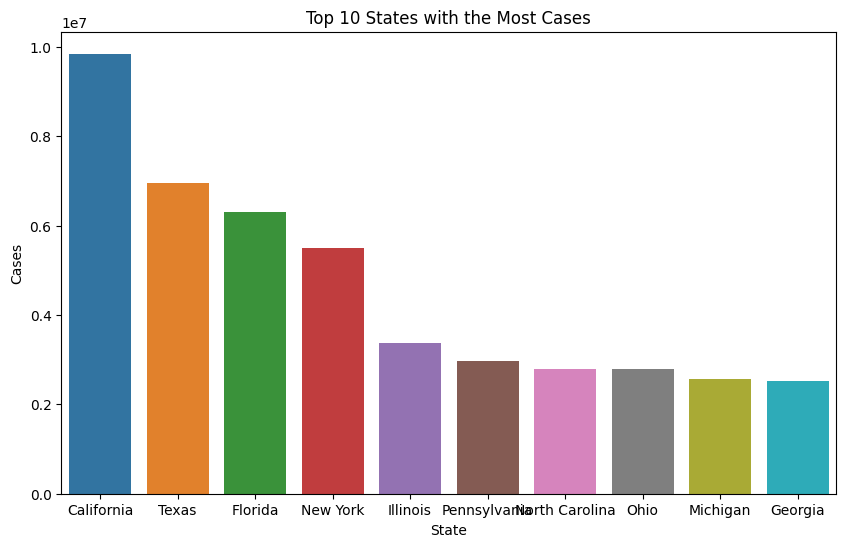

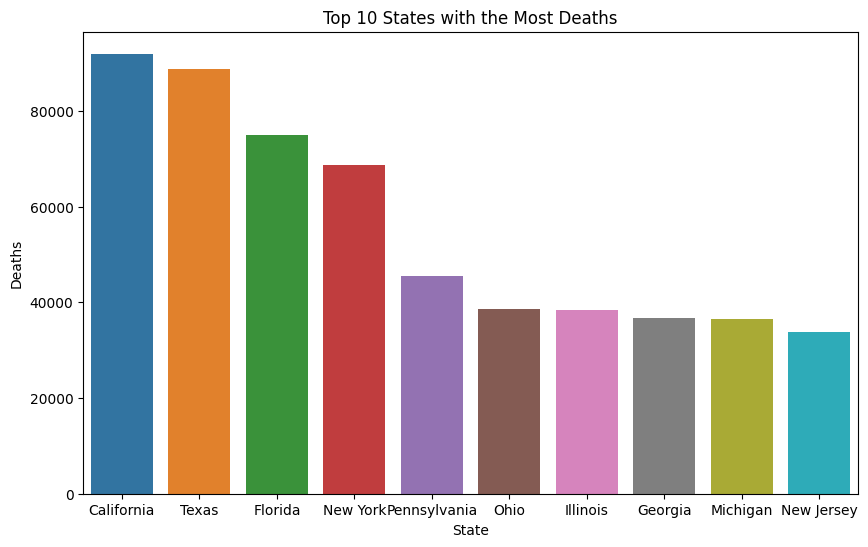

In [30]:
# Sort data by cases and deaths in descending order
nyt_states_data_df_sorted_cases = nyt_states_data_df.sort_values(by='cases', ascending=False).head(10)
nyt_states_data_df_sorted_deaths = nyt_states_data_df.sort_values(by='deaths', ascending=False).head(10)

# Create bar plot for top 10 states with the most cases
plt.figure(figsize=(10,6))
sns.barplot(x='state', y='cases', data=nyt_states_data_df_sorted_cases)
plt.title('Top 10 States with the Most Cases')
plt.xlabel('State')
plt.ylabel('Cases')
plt.show()

# Create bar plot for top 10 states with the most deaths
plt.figure(figsize=(10,6))
sns.barplot(x='state', y='deaths', data=nyt_states_data_df_sorted_deaths)
plt.title('Top 10 States with the Most Deaths')
plt.xlabel('State')
plt.ylabel('Deaths')
plt.show()

=> Dễ dàng thấy rằng số ca nhiễm và số ca tử vong tỉ lệ thuận với dân số ở bang đó. California là tiểu bang có dân số đông nhất.

In [31]:
import plotly.express as px
import plotly.graph_objs as go

In [32]:
nyt_state_static_abv = nyt_state_df.merge(static_state_abv_df, left_on='state', right_on='State', how='left')
nyt_state_static_abv.head()

,date,state,fips,cases,deaths,State,Abbreviation
0,2020-01-21,Washington,53,1,0,Washington,WA
1,2020-01-22,Washington,53,1,0,Washington,WA
2,2020-01-23,Washington,53,1,0,Washington,WA
3,2020-01-24,Illinois,17,1,0,Illinois,IL
4,2020-01-24,Washington,53,1,0,Washington,WA


In [33]:
us_state_case_df = nyt_state_static_abv[['date', 'state', 'cases', 'deaths', 'Abbreviation']]
us_state_case_df.head()

,date,state,cases,deaths,Abbreviation
0,2020-01-21,Washington,1,0,WA
1,2020-01-22,Washington,1,0,WA
2,2020-01-23,Washington,1,0,WA
3,2020-01-24,Illinois,1,0,IL
4,2020-01-24,Washington,1,0,WA


Total Cases growth in US

In [34]:
fig = px.choropleth(us_state_case_df, 
            locations='Abbreviation',
            locationmode='USA-states',
            color='cases',
            hover_name='state',
            hover_data=['cases'],
            scope='usa',
            animation_frame='date',
            color_continuous_scale=px.colors.sequential.dense,
            title='Total Cases growth in US')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Total Deaths growth in US

In [35]:
fig = px.choropleth(us_state_case_df, 
            locations='Abbreviation',
            locationmode='USA-states',
            color='deaths',
            hover_name='state',
            hover_data=['deaths'],
            scope='usa',
            animation_frame='date',
            color_continuous_scale=px.colors.sequential.OrRd,
            title='Total Deaths growth in US')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [36]:
us_state_case_df['Mortality Rate%'] = round((us_state_case_df.deaths/us_state_case_df.cases)*100, 2)
us_state_case_df.head()

C:\Users\guett\AppData\Local\Temp\ipykernel_7164\2152424687.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,date,state,cases,deaths,Abbreviation,Mortality Rate%
0,2020-01-21,Washington,1,0,WA,0.0
1,2020-01-22,Washington,1,0,WA,0.0
2,2020-01-23,Washington,1,0,WA,0.0
3,2020-01-24,Illinois,1,0,IL,0.0
4,2020-01-24,Washington,1,0,WA,0.0


Daily Variation of Mortality Rate% in US

In [37]:
fig = px.choropleth(us_state_case_df, 
            locations='Abbreviation',
            locationmode='USA-states',
            color='Mortality Rate%',
            hover_name='state',
            hover_data=['cases', 'deaths'],
            scope='usa',
            animation_frame='date',
            color_continuous_scale=px.colors.sequential.Magma_r,
            title='Daily Variation of Mortality Rate% in US')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

=> Từ những biểu đồ trên có thể đưa ra một số kết luận:
 * Vùng dịch Covid-19 bắt đầu từ bang Washington ở bờ tây sau đó đã tăng tốc ở New Yor bên mạn bờ đông
 * Tính đến ngày 14/06/2022, số ca nhiễm, tử vong và tỉ lệ tử vong ở bên bờ Đông nhiều hơn bên bờ Tây

 Những điều trên có thể ảnh hưởng bởi một số yếu tố như:
 1. Mật độ dân số: Bờ Đông thường đông dân hơn Bờ Tây
 2. Mô hình du lịch: Các sân bay và trung tâm giao thông chính tập trung hơn ở bờ Đông
 3. Phỏng đoán khi hậu bờ Đông với điều kiện thời tiết ẩm ướt và thayd dổi hơn so với bờ Tây, khả năng ảnh hưởng đến sự sống sót và lây lan của Covid-19
 Ngoài ra còn có thể kể đến các yếu tố như văn hoá, kinh tế xã hội và sự phân phối tuổi ở các vùng miền của nước Mỹ


#### More about Enigma Jhu 

In [49]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#!pip install plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
import datetime as dt
from datetime import timedelta

In [22]:
enigma_jhu_df = pd.read_csv('./query_result/enigma_jhu_results.csv')
enigma_jhu_df.head()

,county,province_state,country_region,last_update,latitude,longitude,confirmed,active,combined_key,recovered,deaths,county_fips
0,San Benito,California,US,2020-02-03T03:53:02,36.576,-120.988,2,0.0,"San Benito, California, US",0,0,6069
1,King,Washington,US,2020-03-02T20:23:16,47.548,-121.984,14,0.0,"King, Washington, US",1,5,53033
2,King,Washington,US,2020-03-04T19:53:02,47.548,-121.984,31,0.0,"King, Washington, US",1,9,53033
3,Snohomish,Washington,US,2020-03-04T19:53:02,48.033,-121.834,8,0.0,"Snohomish, Washington, US",0,1,53061
4,Contra Costa,California,US,2020-03-06T19:43:02,37.853,-121.902,3,0.0,"Contra Costa, California, US",0,0,6013


In [23]:
enigma_jhu_df['active'] = enigma_jhu_df['active'].apply(np.int64)
enigma_jhu_df.head()

,county,province_state,country_region,last_update,latitude,longitude,confirmed,active,combined_key,recovered,deaths,county_fips
0,San Benito,California,US,2020-02-03T03:53:02,36.576,-120.988,2,0,"San Benito, California, US",0,0,6069
1,King,Washington,US,2020-03-02T20:23:16,47.548,-121.984,14,0,"King, Washington, US",1,5,53033
2,King,Washington,US,2020-03-04T19:53:02,47.548,-121.984,31,0,"King, Washington, US",1,9,53033
3,Snohomish,Washington,US,2020-03-04T19:53:02,48.033,-121.834,8,0,"Snohomish, Washington, US",0,1,53061
4,Contra Costa,California,US,2020-03-06T19:43:02,37.853,-121.902,3,0,"Contra Costa, California, US",0,0,6013


In [24]:
# drop wrong value - recovered column
enigma_jhu_df = enigma_jhu_df.drop('recovered', axis=1)

In [ ]:
# add new column named 'recovered' 
# active cases = cofirmed cases - death cases - recovered cases
# -> recovered cases = cofirmed cases - death cases - active cases
enigma_jhu_df['recovered'] = enigma_jhu_df['confirmed'] - enigma_jhu_df['deaths'] - enigma_jhu_df['active']

In [26]:
enigma_jhu_df.head()

,county,province_state,country_region,last_update,latitude,longitude,confirmed,active,combined_key,deaths,county_fips,recovered
0,San Benito,California,US,2020-02-03T03:53:02,36.576,-120.988,2,0,"San Benito, California, US",0,6069,2
1,King,Washington,US,2020-03-02T20:23:16,47.548,-121.984,14,0,"King, Washington, US",5,53033,9
2,King,Washington,US,2020-03-04T19:53:02,47.548,-121.984,31,0,"King, Washington, US",9,53033,22
3,Snohomish,Washington,US,2020-03-04T19:53:02,48.033,-121.834,8,0,"Snohomish, Washington, US",1,53061,7
4,Contra Costa,California,US,2020-03-06T19:43:02,37.853,-121.902,3,0,"Contra Costa, California, US",0,6013,3


In [42]:
datewise = enigma_jhu_df[['country_region','last_update','confirmed', 'active', 'deaths', 'recovered']]
datewise['date'] = pd.to_datetime(datewise['last_update']).dt.date
datewise = datewise.groupby('date').sum().reset_index()
datewise.head()

C:\Users\guett\AppData\Local\Temp\ipykernel_17944\402929100.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datewise['date'] = pd.to_datetime(datewise['last_update']).dt.date
C:\Users\guett\AppData\Local\Temp\ipykernel_17944\402929100.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  datewise = datewise.groupby('date').sum().reset_index()


,date,confirmed,active,deaths,recovered
0,2020-02-01,6,0,0,6
1,2020-02-03,4,0,0,4
2,2020-02-11,1,0,0,1
3,2020-02-13,2,0,0,2
4,2020-02-21,6,0,0,6


In [43]:
datewise['date_since'] = datewise.index - datewise.index.min()
datewise.head()

,date,confirmed,active,deaths,recovered,date_since
0,2020-02-01,6,0,0,6,0
1,2020-02-03,4,0,0,4,1
2,2020-02-11,1,0,0,1,2
3,2020-02-13,2,0,0,2,3
4,2020-02-21,6,0,0,6,4


### Detailed Analysis for Tweets in Covid-19 Pandemic

In [38]:
plt.style.use('ggplot')
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from plotly import tools
init_notebook_mode(connected = True)
import plotly.figure_factory as ff
from sklearn.preprocessing import StandardScaler

import dexplot as dxp
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer

# Nltk for tokenize and stopwords
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
import requests
from PIL import Image
from io import BytesIO
from wordcloud import WordCloud, STOPWORDS

from wordcloud import ImageColorGenerator
RANDOM_SEED = 42


In [39]:
covid_tweets_df = pd.read_csv('./query_result/covid19_tweets.csv')
covid_tweets_df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


In [40]:
def missing_value_of_data(data):
    total=data.isnull().sum().sort_values(ascending=False)
    percentage=round(total/data.shape[0]*100,2)
    return pd.concat([total,percentage],axis=1,keys=['Total','Percentage'])

def duplicated_values_data(data):
    dup=[]
    columns=data.columns
    for i in data.columns:
        dup.append(sum(data[i].duplicated()))
    return pd.concat([pd.Series(columns),pd.Series(dup)],axis=1,keys=['Columns','Duplicate count'])

def unique_values_in_column(data,feature):
    unique_val=pd.Series(data.loc[:,feature].unique())
    return pd.concat([unique_val],axis=1,keys=['Unique Values'])

def count_values_in_column(data,feature):
    total=data.loc[:,feature].value_counts(dropna=False)
    percentage=round(data.loc[:,feature].value_counts(dropna=False,normalize=True)*100,2)
    return pd.concat([total,percentage],axis=1,keys=['Total','Percentage'])

def ngrams_top(corpus,ngram_range,n=None):
    """
    List the top n words in a vocabulary according to occurrence in a text corpus.
    """
    vec = CountVectorizer(stop_words = 'english',ngram_range=ngram_range).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    total_list=words_freq[:n]
    df=pd.DataFrame(total_list,columns=['text','count'])
    return df

In [41]:
missing_value_of_data(covid_tweets_df)

,Total,Percentage
hashtags,42208,28.60
user_location,29990,20.32
user_description,8365,5.67
source,48,0.03
user_name,0,0.00
user_created,0,0.00
user_followers,0,0.00
user_friends,0,0.00
user_favourites,0,0.00
user_verified,0,0.00


In [42]:
duplicated_values_data(covid_tweets_df)

,Columns,Duplicate count
0,user_name,68633
1,user_location,124045
2,user_description,71720
3,user_created,67418
4,user_followers,122864
5,user_friends,137539
6,user_favourites,116317
7,user_verified,147599
8,date,36075
9,text,327


In [43]:
count_values_in_column(covid_tweets_df,'user_location')

,Total,Percentage
user_location,,
NaN,29990,20.32
India,3117,2.11
United States,1991,1.35
"New Delhi, India",1447,0.98
"Mumbai, India",1136,0.77
...,...,...
NYC Not-for-Profit I 🚫No DMs!,1,0.00
Kitchen,1,0.00
"Bonnyville, AB",1,0.00


In [44]:
count_values_in_column(covid_tweets_df,'hashtags')

,Total,Percentage
hashtags,,
NaN,42208,28.60
['COVID19'],31057,21.04
['Covid19'],4097,2.78
['covid19'],2554,1.73
"['coronavirus', 'CoronaVirusUpdate', 'COVID19', 'CoronavirusPandemic']",481,0.33
...,...,...
['publicsector'],1,0.00
['Eskom'],1,0.00
['Hospitalist'],1,0.00


findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: 

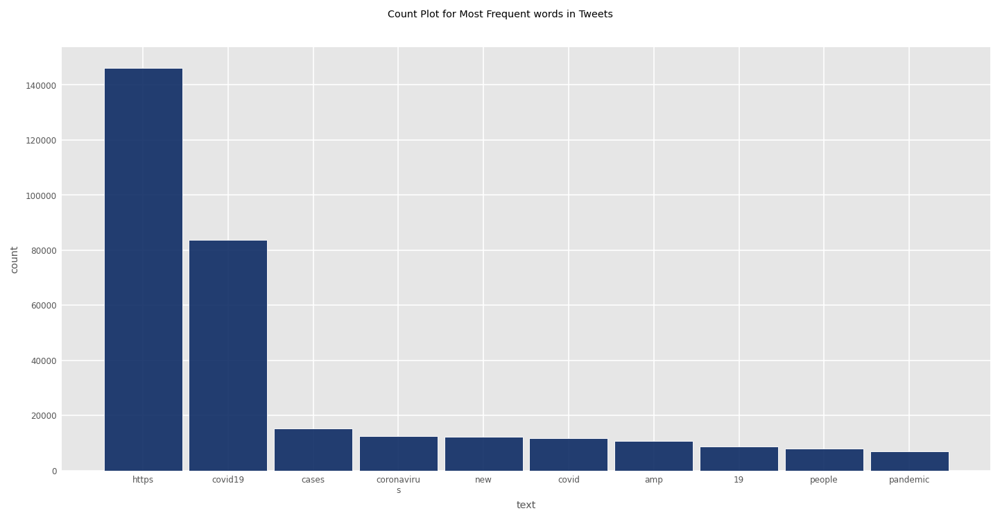

In [45]:
dd_11 = ngrams_top(covid_tweets_df['text'],(1,1),n=10)
dxp.bar(x='text', y='count', data=dd_11,figsize=(10,5),cmap='dark12_r',title='Count Plot for Most Frequent words in Tweets')

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: 

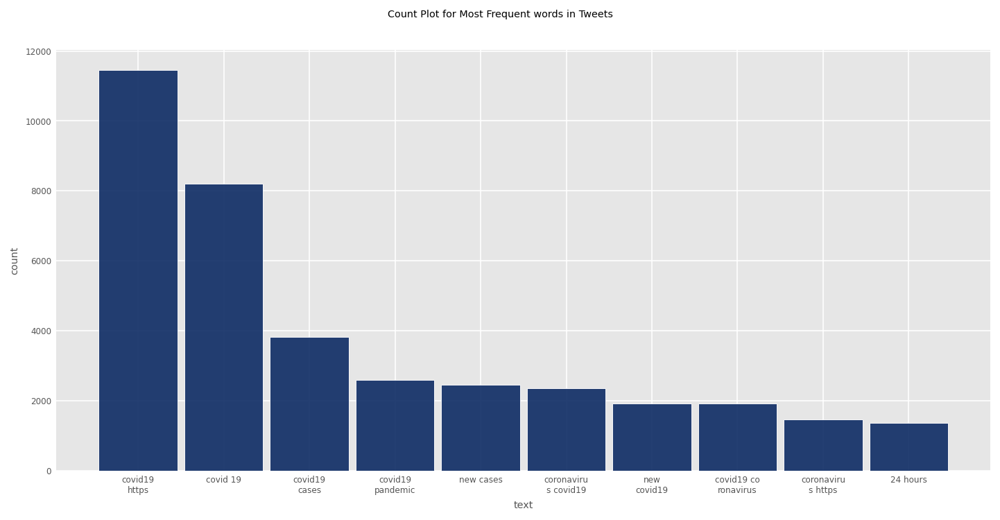

In [46]:
dd_22 = ngrams_top(covid_tweets_df['text'],(2,2),n=10)
dxp.bar(x='text', y='count', data=dd_22,figsize=(10,5),cmap='dark12_r',title='Count Plot for Most Frequent words in Tweets')

findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: Font family 'Helvetica' not found.
findfont: 

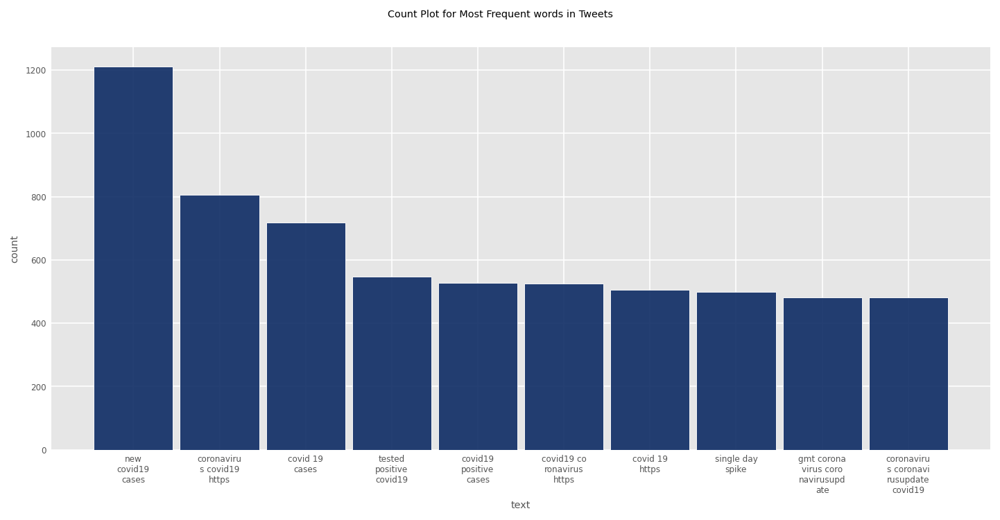

In [47]:
dd_33 = ngrams_top(covid_tweets_df['text'],(3,3),n=10)
dd_33_plot = dxp.bar(x='text', y='count', data=dd_33,figsize=(10,5),cmap='dark12_r',title='Count Plot for Most Frequent words in Tweets')
dd_33_plot

In [48]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer

# Nltk for tokenize and stopwords
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
import requests
from PIL import Image
from io import BytesIO
from wordcloud import WordCloud, STOPWORDS
from wordcloud import ImageColorGenerator
RANDOM_SEED = 42

In [49]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\guett\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [50]:
hashtags = covid_tweets_df['hashtags'].dropna().tolist()
hashtags_list = [tag.strip("[]'") for tag in " ".join(hashtags).split(",")]
text = "".join(hashtags_list)
new_string = text.replace("'", "").replace("[", "").replace("]", "")
new_string
# Remove duplicate words
word_list = new_string.replace("'", "").split()
word_set = set(word_list)
input_str = " ".join(list(word_set))

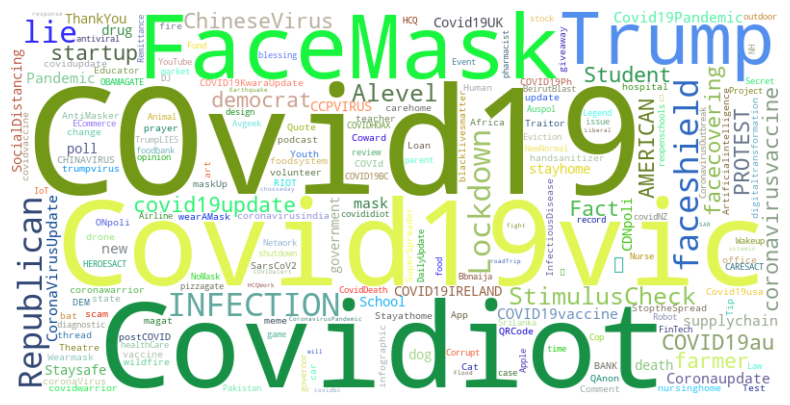

In [51]:
def random_color(word=None, font_size=None, position=None, orientation=None, font_path=None, random_state=None):
    import random
    return "hsl({}, {}%, {}%)".format(random.randint(0, 255), random.randint(0, 100), random.randint(30, 70))

# Create the word cloud object with custom colors
wordcloud = WordCloud(background_color="white", width=800, height=400, color_func=random_color).generate(input_str)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

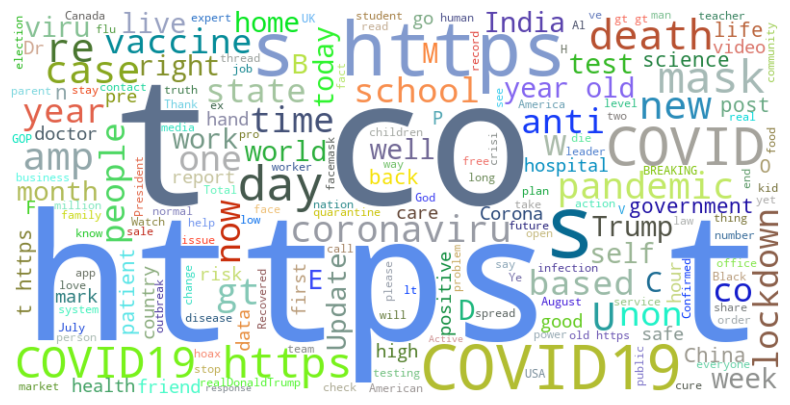

In [52]:
tweet_text = covid_tweets_df['text'].dropna().tolist()
tweet_text_list = [tag.strip("[]'") for tag in " ".join(tweet_text).split(",")]
text = "".join(tweet_text_list)
new_string = text.replace("[", "").replace("]", "")
# Remove duplicate words
word_list = new_string.split()
word_set = set(word_list)
input_str = " ".join(list(word_set))
def random_color(word=None, font_size=None, position=None, orientation=None, font_path=None, random_state=None):
    import random
    return "hsl({}, {}%, {}%)".format(random.randint(0, 255), random.randint(0, 100), random.randint(30, 70))

# Create the word cloud object with custom colors
wordcloud = WordCloud(background_color="white", width=800, height=400, color_func=random_color).generate(input_str)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()